# Challenge 1

**Goal** - Create a template for the class to use for building their capstone

**Requirements** - A successful project template at minimum includes sections to:

>1. Introduce the writer (of the capstone, not the template)
>2. Overviews the problem or area being investigated by the Capstone
>3. Succinctly captures the question being investigated
>4. Provides an overview of the data being used to answer the question
>5. Concludes with a summarized overview of the findings.

Here's a [cheat sheet](https://github.com/adam-p/markdown-here/wiki/Markdown-Here-Cheatsheet) to get you started on Markdown formatting. 

To submit - 
>1. Fork the ClassChallenge repo then clone it to your computer
>2. Complete the template on your computer
>3. Rename it to {Your Name}-CapstoneTemplate.ipynb
>4. Send it to your online repo
>     - git add .
>     - git commit -m "Capstone Template Submission"
>     - git push
>5. Submission has two options - Slack the Instructional Team the link to your submission in your repo ***or*** figure out the pull request process

In [3]:
# Maybe switch a Cell to Markdown and use it for the introduction with each area in a new cell

In [4]:
# Leave a few blocks open and use these comments that start with a Hash to leave space for the Data Science Workflow 

In [5]:
# Findings shouldn't necessarily be in comments... should they?

## This is my area for Machine learning

Philip Peker Capstone Project

Project Goal: To show a strong understanding of the power of Spotify data, specifically as a data analysis tool to better understand global music trends and patterns. 

Hypothesis 1: Using Spotify data, we predict which country or region a song's artist is from based on song attributes. 

Plausible Datasets:
https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks
https://www.kaggle.com/yamaerenay/spotify-artists-dataset-19222021

Goals/Metrics: I aim for 80% accuracy for the model to predict region of origin for said artist based on song attributes.  

Risks/Limitations:
- One key variable i'll need to identify is country/region of origin for each artist. This datapoint is not currently available with the Spotify Web API (see here: https://github.com/spotify/web-api/issues/210). Thus, no datasets based on the Spotify Web API will have this datapoint. 
    Solution 1: Identify a sample size n, for which I will manually need to input what country each i in n is from (i being artist)
    Solution 2: Pivot to second Hypothesis.
    
- There are a sizeable amount of x variables, and finding the right mix of x variables that best predict the y may be challenging. 

Hypothesis 2: Using Spotify data, we predict genre of song based on it's attributes, such as: danceability, valence, energy, acousticness, tempo etc. 

Goals Metrics: I aim for 80% accuracy for the model to predict genre based on song attributes. 

Risk/Limitations: 
- The way Spotify breaks out the genre categories is subjective and arbitrary (as genres are pretty fluid). This will be an inherent bias in my data, and will have generalization limitations outside of Spotify. So when I talk about "music", it must be caveated as music as Spotify defines it. 
- There are a sizeable amount of x variables, and finding the right mix of x variables that best predict the y may be challenging. 

    
    
Other key documents:
- https://spotipy.readthedocs.io/en/2.18.0/
  python library for Spotify web API 





## Initial EDA

In [6]:
import pandas as pd
import numpy as np 
import seaborn as sns
import os 
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf


%matplotlib inline

In [7]:
print("my path is ", os.getcwd()) 

my path is  /Users/philip.peker/Documents/DataScience/Class-Challenge/SpotifyData


In [8]:
data = pd.read_csv("tracks.csv") 
data.head(15)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.744000,0.1510,0.1270,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.000000,0.1480,0.6550,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.021800,0.2120,0.4570,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.918000,0.1040,0.3970,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.130000,0.3110,0.1960,103.220,4
5,0BRXJHRNGQ3W4v9frnSfhu,Ave Maria,0,178933,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.227,0.2610,5,-12.343,1,0.0382,0.994,0.247000,0.0977,0.0539,118.891,4
6,0Dd9ImXtAtGwsmsAD69KZT,La Butte Rouge,0,134467,0,['Francis Marty'],['2nuMRGzeJ5jJEKlfS7rZ0W'],1922,0.510,0.3550,4,-12.833,1,0.1240,0.965,0.000000,0.1550,0.7270,85.754,5
7,0IA0Hju8CAgYfV1hwhidBH,La Java,0,161427,0,['Mistinguett'],['4AxgXfD7ISvJSTObqm4aIE'],1922,0.563,0.1840,4,-13.757,1,0.0512,0.993,0.000016,0.3250,0.6540,133.088,3
8,0IgI1UCz84pYeVetnl1lGP,Old Fashioned Girl,0,310073,0,['Greg Fieler'],['5nWlsH5RDgFuRAiDeOFVmf'],1922,0.488,0.4750,0,-16.222,0,0.0399,0.620,0.006450,0.1070,0.5440,139.952,4
9,0JV4iqw2lSKJaHBQZ0e5zK,Martín Fierro - Remasterizado,0,181173,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-29,0.548,0.0391,6,-23.228,1,0.1530,0.996,0.933000,0.1480,0.6120,75.595,3


In [9]:
data.shape

(586672, 20)

In [10]:
data.columns

Index(['id', 'name', 'popularity', 'duration_ms', 'explicit', 'artists',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')

In [11]:
pd.DataFrame(data.dtypes, columns=['DataType'])


,DataType
id,object
name,object
popularity,int64
duration_ms,int64
explicit,int64
artists,object
id_artists,object
release_date,object
danceability,float64
energy,float64


In [12]:
data[['danceability', 'energy', 'tempo']].describe()


,danceability,energy,tempo
count,586672.000000,586672.000000,586672.000000
mean,0.563594,0.542036,118.464857
std,0.166103,0.251923,29.764108
min,0.000000,0.000000,0.000000
25%,0.453000,0.343000,95.600000
50%,0.577000,0.549000,117.384000
75%,0.686000,0.748000,136.321000
max,0.991000,1.000000,246.381000


In [13]:
data['time_signature'].unique()


array([3, 1, 5, 4, 0])

In [14]:
data['loudness'].unique()


array([-13.338, -22.136, -21.18 , ..., -29.059, -28.573, -25.551])

In [15]:
data['popularity'].unique()



array([  6,   0,   1,   4,  41,  38,  30,  28,  27,  26,  25,  23,  22,
        20,  18,  17,  16,  15,  14,  11,  10,   8,   9,   5,   7,   2,
        39,  33,  32,  24,  21,  19,  13,  12,   3,  51,  48,  40,  34,
        29,  47,  43,  37,  35,  31,  55,  50,  36,  42,  65,  53,  45,
        49,  46,  44,  52,  56,  54,  61,  62,  57,  69,  58,  68,  60,
        64,  63,  67,  66,  59,  74,  71,  77,  70,  79,  75,  73,  72,
        80,  78,  76,  82,  83,  84,  81,  86,  85,  87,  90,  88,  89,
        94,  92,  97,  96,  95,  93,  91, 100,  99,  98])

In [16]:
data.sort_values(by='popularity', ascending=False).head(12)


,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
93802,4iJyoBOLtHqaGxP12qzhQI,Peaches (feat. Daniel Caesar & Giveon),100,198082,1,"['Justin Bieber', 'Daniel Caesar', 'Giveon']","['1uNFoZAHBGtllmzznpCI3s', '20wkVLutqVOYrc0kxF...",2021-03-19,0.677,0.696,0,-6.181,1,0.1190,0.32100,0.000000,0.4200,0.464,90.030,4
93803,7lPN2DXiMsVn7XUKtOW1CS,drivers license,99,242014,1,['Olivia Rodrigo'],['1McMsnEElThX1knmY4oliG'],2021-01-08,0.585,0.436,10,-8.761,1,0.0601,0.72100,0.000013,0.1050,0.132,143.874,4
93804,3Ofmpyhv5UAQ70mENzB277,Astronaut In The Ocean,98,132780,0,['Masked Wolf'],['1uU7g3DNSbsu0QjSEqZtEd'],2021-01-06,0.778,0.695,4,-6.865,0,0.0913,0.17500,0.000000,0.1500,0.472,149.996,4
92810,5QO79kh1waicV47BqGRL3g,Save Your Tears,97,215627,1,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,0.680,0.826,0,-5.487,1,0.0309,0.02120,0.000012,0.5430,0.644,118.051,4
92811,6tDDoYIxWvMLTdKpjFkc1B,telepatía,97,160191,0,['Kali Uchis'],['1U1el3k54VvEUzo3ybLPlM'],2020-12-04,0.653,0.524,11,-9.016,0,0.0502,0.11200,0.000000,0.2030,0.553,83.970,4
93805,7MAibcTli4IisCtbHKrGMh,Leave The Door Open,96,242096,0,"['Bruno Mars', 'Anderson .Paak', 'Silk Sonic']","['0du5cEVh5yTK9QJze8zA0C', '3jK9MiCrA42lLAdMGU...",2021-03-05,0.586,0.616,5,-7.964,1,0.0324,0.18200,0.000000,0.0927,0.719,148.088,4
92813,0VjIjW4GlUZAMYd2vXMi3b,Blinding Lights,96,200040,0,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,0.514,0.730,1,-5.934,1,0.0598,0.00146,0.000095,0.0897,0.334,171.005,4
92814,6f3Slt0GbA2bPZlz0aIFXN,The Business,95,164000,0,['Tiësto'],['2o5jDhtHVPhrJdv3cEQ99Z'],2020-09-16,0.798,0.620,8,-7.079,0,0.2320,0.41400,0.019200,0.1120,0.235,120.031,4
92816,3FAJ6O0NOHQV8Mc5Ri6ENp,Heartbreak Anniversary,94,198371,0,['Giveon'],['4fxd5Ee7UefO4CUXgwJ7IP'],2020-03-27,0.449,0.465,0,-8.964,1,0.0791,0.52400,0.000001,0.3030,0.543,89.087,3
92819,1xK1Gg9SxG8fy2Ya373oqb,Bandido,94,232853,0,"['Myke Towers', 'Juhn']","['7iK8PXO48WeuP03g8YR51W', '2LmcxBak1alK1bf7d1...",2020-12-10,0.713,0.617,8,-4.637,1,0.0887,0.12200,0.000000,0.0962,0.682,168.021,4


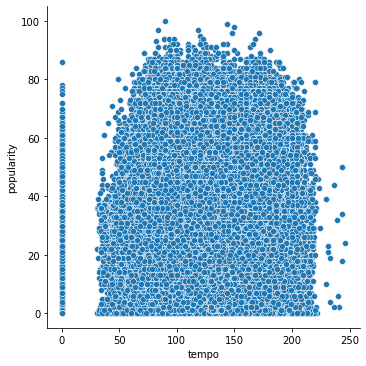

In [17]:
sns.relplot(x="tempo", y="popularity", data=data)

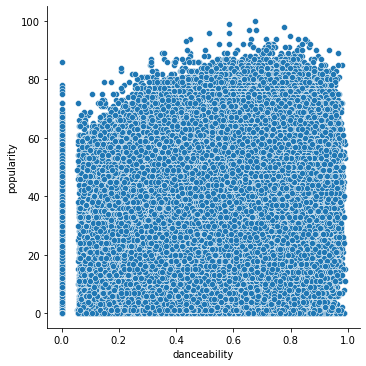

In [18]:
sns.relplot(x="danceability", y="popularity", data=data)

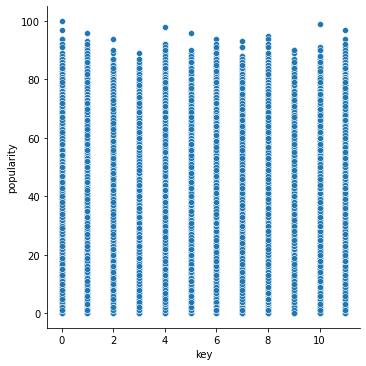

In [19]:
sns.relplot(x="key", y="popularity", data=data)

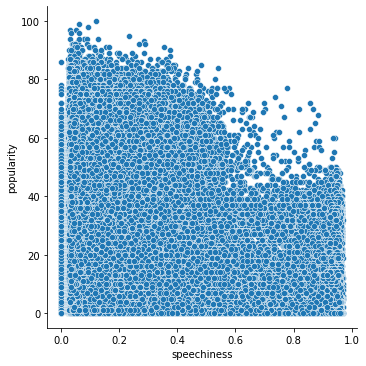

In [20]:
sns.relplot(x="speechiness", y="popularity", data=data)

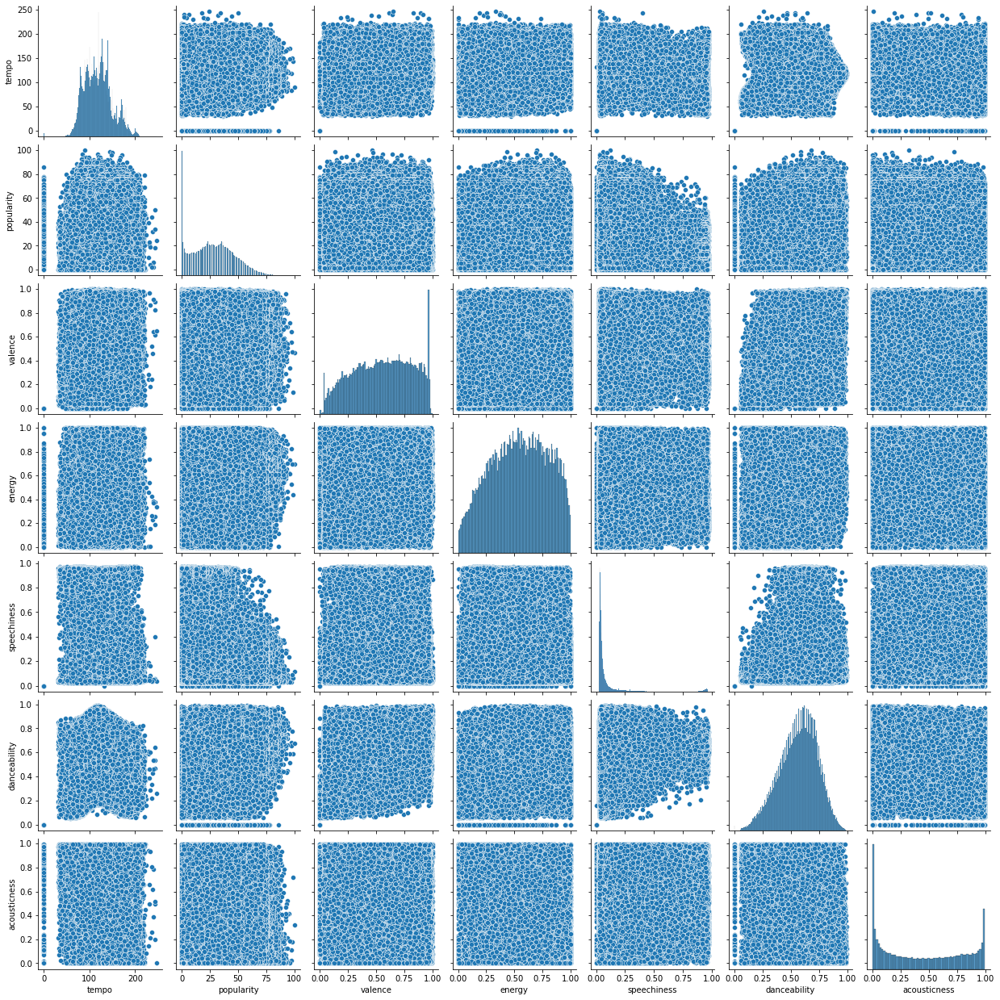

In [21]:
sns.pairplot(data, vars=['tempo', 'popularity', 'valence', 'energy', 'speechiness', 'danceability', 'acousticness'])

<AxesSubplot:>

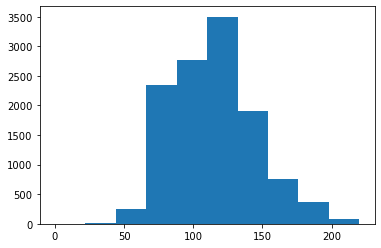

In [22]:
data[data['popularity'] == 1]['tempo'].hist(grid=False, bins=10)


<AxesSubplot:>

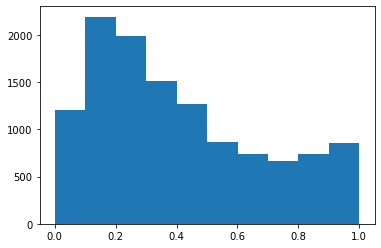

In [23]:
data[data['popularity'] == 1]['energy'].hist(grid=False, bins=10)


<AxesSubplot:>

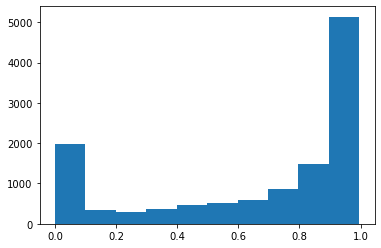

In [24]:
data[data['popularity'] == 1]['acousticness'].hist(grid=False, bins=10)


<AxesSubplot:>

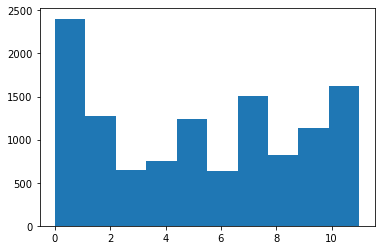

In [25]:
data[data['popularity'] == 1]['key'].hist(grid=False, bins=10)


In [26]:
data.describe()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,586672.000000,5.866720e+05,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000,586672.000000
mean,27.570053,2.300512e+05,0.044086,0.563594,0.542036,5.221603,-10.206067,0.658797,0.104864,0.449863,0.113451,0.213935,0.552292,118.464857,3.873382
std,18.370642,1.265261e+05,0.205286,0.166103,0.251923,3.519423,5.089328,0.474114,0.179893,0.348837,0.266868,0.184326,0.257671,29.764108,0.473162
min,0.000000,3.344000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13.000000,1.750930e+05,0.000000,0.453000,0.343000,2.000000,-12.891000,0.000000,0.034000,0.096900,0.000000,0.098300,0.346000,95.600000,4.000000
50%,27.000000,2.148930e+05,0.000000,0.577000,0.549000,5.000000,-9.243000,1.000000,0.044300,0.422000,0.000024,0.139000,0.564000,117.384000,4.000000
75%,41.000000,2.638670e+05,0.000000,0.686000,0.748000,8.000000,-6.482000,1.000000,0.076300,0.785000,0.009550,0.278000,0.769000,136.321000,4.000000
max,100.000000,5.621218e+06,1.000000,0.991000,1.000000,11.000000,5.376000,1.000000,0.971000,0.996000,1.000000,1.000000,1.000000,246.381000,5.000000


In [27]:
print(data.keys())

Index(['id', 'name', 'popularity', 'duration_ms', 'explicit', 'artists',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')


In [28]:
pd.isnull(data).sum()


id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [29]:
null_data = data[data.isnull().any(axis=1)]
print(null_data)

                            id name  popularity  duration_ms  explicit  \
226336  4iH7negBYMfj2z0wDNmgdx  NaN          28       264973         0   
510975  04d5kbLvSAIBt3pGcljdhC  NaN           0       184293         0   
510976  05tRkgyxVdwMePGqOXMDYU  NaN           0       191587         0   
510978  0YAMRgAQH6tkTh4sWNXr8L  NaN           0       191573         0   
510979  1K6MQQxmFpPb66ZnaiIpHX  NaN           0       167602         0   
...                        ...  ...         ...          ...       ...   
517206  6OH9mz9aFbGlbf74cBwYWD  NaN           2       209760         0   
517215  15RqFDA86slfzujSQMEX4i  NaN           2       257280         0   
520127  0hKA9A2JPtFdg0fiMhyjQD  NaN           6       194081         0   
525238  1kR4gIb7nGxHPI3D2ifs59  NaN          26       289440         0   
525265  4xyBq8t4nkUKH8s28j6ZoD  NaN          24       254000         0   

       artists                  id_artists release_date  danceability  energy  \
226336    ['']  ['0LyfQWJT6nXa

In [30]:
data.dropna(inplace = True)

In [31]:
pd.isnull(data).sum()


id                  0
name                0
popularity          0
duration_ms         0
explicit            0
artists             0
id_artists          0
release_date        0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
dtype: int64

/Users/philip.peker/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Popularity Distribution')

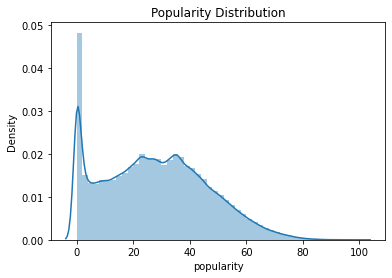

In [32]:
sns.distplot(data['popularity']).set_title('Popularity Distribution')


In [33]:
data.corr()


,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
popularity,1.000000,0.027638,0.211749,0.186878,0.302178,0.015306,0.327001,-0.033652,-0.047415,-0.370723,-0.236403,-0.048735,0.004558,0.071223,0.086713
duration_ms,0.027638,1.000000,-0.016753,-0.120411,0.024782,0.004625,0.000314,-0.027604,-0.125783,-0.064394,0.069327,0.002139,-0.163233,-0.001249,0.037553
explicit,0.211749,-0.016753,1.000000,0.150216,0.123060,0.010933,0.134598,-0.051757,0.102251,-0.149001,-0.067510,-0.013113,-0.016551,0.005723,0.044442
danceability,0.186878,-0.120411,0.150216,1.000000,0.241464,0.018837,0.251394,-0.044726,0.199291,-0.242838,-0.225831,-0.106175,0.528136,-0.040896,0.146166
energy,0.302178,0.024782,0.123060,0.241464,1.000000,0.036303,0.764744,-0.065238,-0.053560,-0.715366,-0.195727,0.124636,0.372224,0.230006,0.188971
key,0.015306,0.004625,0.010933,0.018837,0.036303,1.000000,0.027106,-0.129495,-0.001034,-0.027427,-0.006788,-0.006763,0.019998,0.004912,0.008871
loudness,0.327001,0.000314,0.134598,0.251394,0.764744,0.027106,1.000000,-0.040456,-0.167140,-0.519423,-0.329255,0.029509,0.275416,0.189252,0.164376
mode,-0.033652,-0.027604,-0.051757,-0.044726,-0.065238,-0.129495,-0.040456,1.000000,-0.017992,0.058914,-0.010023,0.007025,0.011494,0.007877,-0.015899
speechiness,-0.047415,-0.125783,0.102251,0.199291,-0.053560,-0.001034,-0.167140,-0.017992,1.000000,0.069121,-0.102425,0.207062,0.046481,-0.086950,-0.114211
acousticness,-0.370723,-0.064394,-0.149001,-0.242838,-0.715366,-0.027427,-0.519423,0.058914,0.069121,1.000000,0.204312,-0.004742,-0.180878,-0.195117,-0.173920


<AxesSubplot:xlabel='time_signature', ylabel='popularity'>

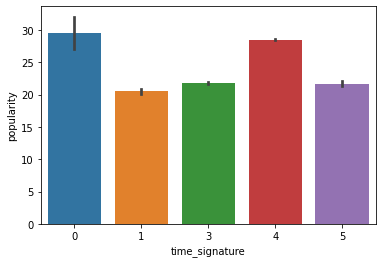

In [34]:
sns.barplot(x = 'time_signature', y = 'popularity', data = data)


<AxesSubplot:xlabel='key', ylabel='popularity'>

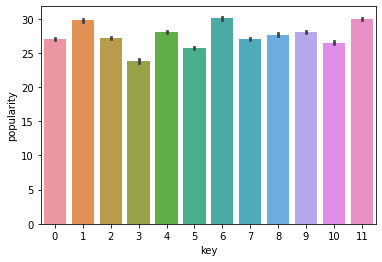

In [35]:
sns.barplot(x = 'key', y = 'popularity', data = data)
#btw, all keys encoded as values ranging from 0 to 11, starting on C as 0, C# as 1 and so on…

<AxesSubplot:xlabel='mode', ylabel='popularity'>

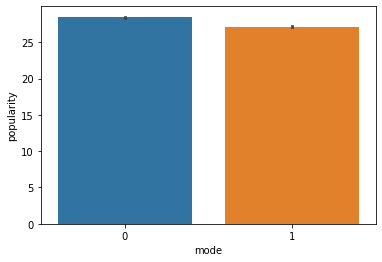

In [36]:
sns.barplot(x = 'mode', y = 'popularity', data = data)
#0 mode = minor, 1 mode = major

<AxesSubplot:xlabel='mode', ylabel='popularity'>

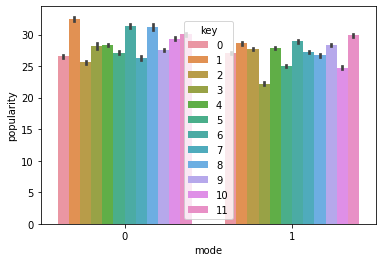

In [37]:
#key and mode are related in music, so let's combine them 
sns.barplot(x = 'mode', y = 'popularity', hue = 'key', data = data)


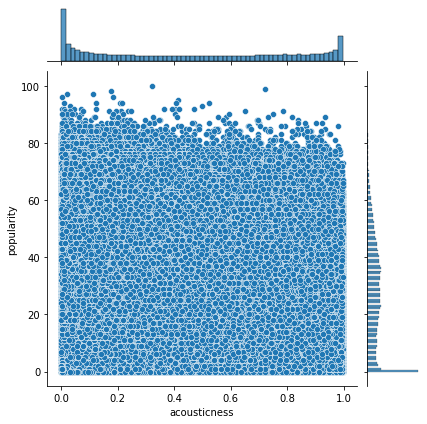

In [38]:
sns.jointplot(x = 'acousticness', y = 'popularity', data = data)


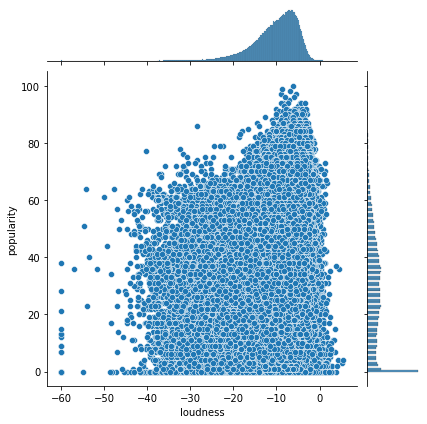

In [39]:
sns.jointplot(x = 'loudness', y = 'popularity', data = data)


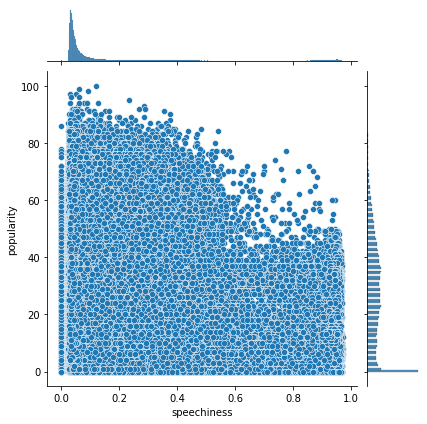

In [40]:
sns.jointplot(x = 'speechiness', y = 'popularity', data = data)


/Users/philip.peker/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='acousticness', ylabel='Density'>

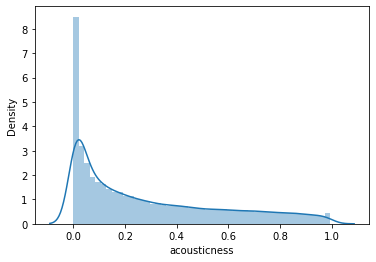

In [41]:
popular_greater_50 = data[data.popularity > 50]
sns.distplot(popular_greater_50['acousticness'])

/Users/philip.peker/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='acousticness', ylabel='Density'>

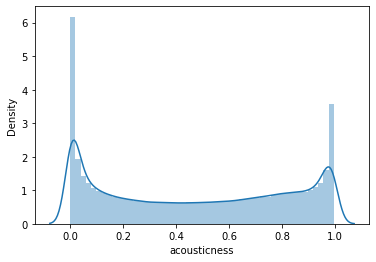

In [42]:
popular_less_50 = data[data.popularity < 50]
sns.distplot(popular_less_50['acousticness'])

/Users/philip.peker/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='loudness', ylabel='Density'>

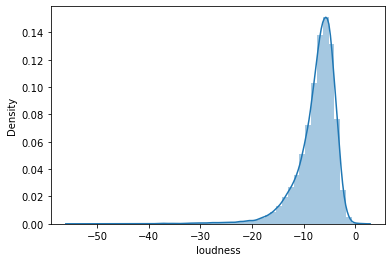

In [43]:
sns.distplot(popular_greater_50['loudness'])


/Users/philip.peker/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='loudness', ylabel='Density'>

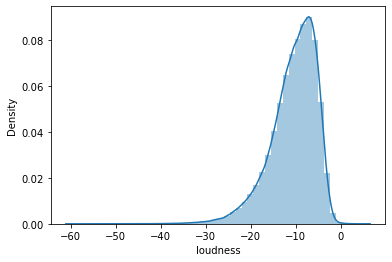

In [44]:
popular_less_50 = data[data.popularity < 50]
sns.distplot(popular_less_50['loudness'])

In [45]:
#one thing i'd like to change moving forward is express duration in minutes and not milliseconds. 
data['duration_m'] = data['duration_ms']/60000
data = data.reindex(sorted(data.columns), axis=1)
data.head()


,acousticness,artists,danceability,duration_m,duration_ms,energy,explicit,id,id_artists,instrumentalness,...,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,time_signature,valence
0,0.674,['Uli'],0.645,2.115050,126903,0.4450,0,35iwgR4jXetI318WEWsa1Q,['45tIt06XoI0Iio4LBEVpls'],0.7440,...,0.151,-13.338,1,Carve,6,1922-02-22,0.4510,104.851,3,0.127
1,0.797,['Fernando Pessoa'],0.695,1.636667,98200,0.2630,0,021ht4sdgPcrDgSk7JTbKY,['14jtPCOoNZwquk5wd9DxrY'],0.0000,...,0.148,-22.136,1,Capítulo 2.16 - Banquero Anarquista,0,1922-06-01,0.9570,102.009,1,0.655
2,0.994,['Ignacio Corsini'],0.434,3.027333,181640,0.1770,0,07A5yehtSnoedViJAZkNnc,['5LiOoJbxVSAMkBS2fUm3X2'],0.0218,...,0.212,-21.180,1,Vivo para Quererte - Remasterizado,0,1922-03-21,0.0512,130.418,5,0.457
3,0.995,['Ignacio Corsini'],0.321,2.948450,176907,0.0946,0,08FmqUhxtyLTn6pAh6bk45,['5LiOoJbxVSAMkBS2fUm3X2'],0.9180,...,0.104,-27.961,1,El Prisionero - Remasterizado,0,1922-03-21,0.0504,169.980,3,0.397
4,0.989,['Dick Haymes'],0.402,2.718000,163080,0.1580,0,08y9GfoqCWfOGsKdwojr5e,['3BiJGZsyX9sJchTqcSA7Su'],0.1300,...,0.311,-16.900,0,Lady of the Evening,0,1922,0.0390,103.220,4,0.196


In [46]:
data.drop('duration_ms', axis = 1, inplace = True)


In [47]:
data.describe()

,acousticness,danceability,duration_m,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,time_signature,valence
count,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000,586601.000000
mean,0.449803,0.563612,3.834248,0.542071,0.044091,0.113425,5.221594,0.213933,-10.205789,0.658797,27.573212,0.104870,118.467930,3.873410,0.552306
std,0.348812,0.166101,2.108880,0.251910,0.205298,0.266843,3.519420,0.184328,5.089422,0.474114,18.369417,0.179902,29.762942,0.473112,0.257673
min,0.000000,0.000000,0.055733,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.096900,0.453000,2.918050,0.343000,0.000000,0.000000,2.000000,0.098300,-12.891000,0.000000,13.000000,0.034000,95.606000,4.000000,0.346000
50%,0.422000,0.577000,3.581783,0.549000,0.000000,0.000024,5.000000,0.139000,-9.242000,1.000000,27.000000,0.044300,117.387000,4.000000,0.564000
75%,0.784000,0.686000,4.397783,0.748000,0.000000,0.009550,8.000000,0.278000,-6.481000,1.000000,41.000000,0.076300,136.324000,4.000000,0.769000
max,0.996000,0.991000,93.686967,1.000000,1.000000,1.000000,11.000000,1.000000,5.376000,1.000000,100.000000,0.971000,246.381000,5.000000,1.000000


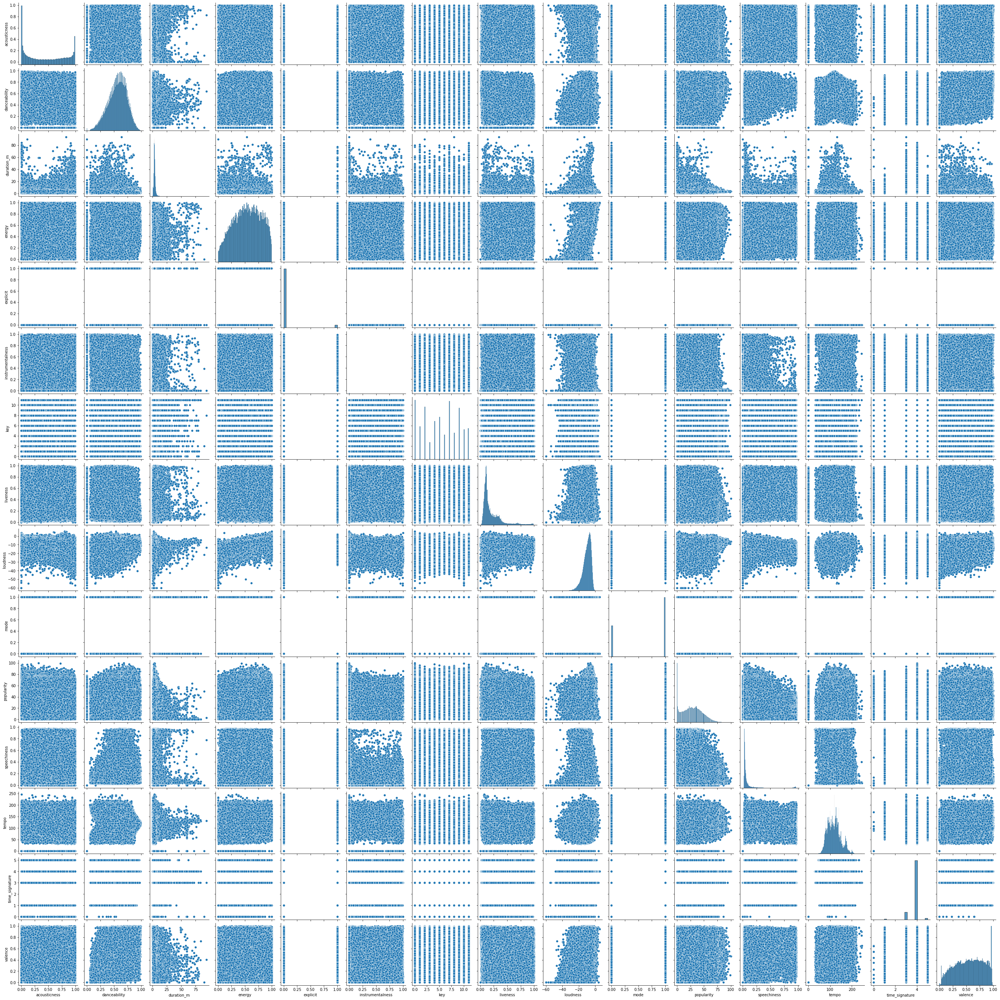

In [48]:
sns.pairplot(data)


In [49]:
#spotting outliers. Let's look at songs that are over 60 minutes long 
data[data['duration_m']>60]

,acousticness,artists,danceability,duration_m,energy,explicit,id,id_artists,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,time_signature,valence
59432,0.976000,['Brian Eno'],0.0918,60.846667,0.056900,0,4t3Yh6tKkxXrc458pNI7zZ,['7MSUfLeTdDEoZiJPDSBXgi'],0.88400,0,0.0842,-31.808,1,Thursday Afternoon - 2005 Digital Remaster,39,1985-10-01,0.0358,81.944,3,0.0528
79965,0.006100,['Various Artists'],0.7530,72.800000,0.829000,0,4jcy1pM1HbnuqPqKlBnM6i,['0LyfQWJT6nXafLPZqxe9Of'],0.18300,1,0.0440,-6.797,1,The Best of Chillifunk Ten Years 1996-2006 (No...,0,2006-02-17,0.0417,127.280,4,0.7210
79967,0.006100,['Various Artists'],0.7530,72.800000,0.829000,0,0LfoartMBLZIQ4AHWBYdob,['0LyfQWJT6nXafLPZqxe9Of'],0.18300,1,0.0440,-6.797,1,The Best of Chillifunk Ten Years 1996-2006 (No...,0,1996,0.0417,127.280,4,0.7210
82551,0.000599,['Dj Emma'],0.7920,78.278167,0.742000,0,5EvdM8FjgviSxQCb2FuH1d,['0rhY5SJ2Re04pDcAbGKgo9'],0.83800,6,0.0930,-6.899,0,Happy New Year Mix 2009,1,2009-12-25,0.0520,128.001,4,0.2270
83471,0.584000,['Bishop Norman L. Wagner'],0.5180,70.582450,0.348000,0,3bhMyYMXkK89VAIB52rtjA,['14D23I203ITLC95b5ndqEh'],0.00000,1,0.5820,-22.459,1,2010 the Year of the Open Door,0,2010-01-03,0.9140,54.613,3,0.0860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546268,0.963000,"['William Johnstone', 'Steve Dunne', 'Nelson W...",0.6850,60.986783,0.331000,0,0GTX4MhBXrvJLGSSapeVdS,"['74YojzlNtuLkvb6KLIgmmf', '6UwN0BpPwGrm2GijDf...",0.00000,8,0.7830,-15.493,1,"Lux Radio Theater, The Man Who Came To Dinner ...",0,1950-03-27,0.9480,104.147,4,0.6190
564662,0.139000,['Einschlafmusik'],0.0000,60.185933,0.000020,0,0bK7dc3ymXNPntoJmkFTnk,['5QLzxDRFscNIKoWJgUdCmh'],0.45500,1,0.1230,-26.079,1,Braunes Rauschen oszillierend als Einschlafhil...,30,2013-01-30,0.0000,0.000,0,0.0000
566091,0.709000,['Bajka Muzyczna'],0.5810,60.143383,0.087100,0,1lgBc0keIyuVQdnoCdBiys,['5bnxS5RyPx8i1ZM4AK54rN'],0.00000,7,0.0709,-25.635,0,Opowieść o Praprasłoniu,12,1983-01-10,0.8870,86.723,4,0.4090
568269,0.102000,['Soothing White Noise for Relaxation'],0.0000,72.000467,0.000046,0,1NHBwKuLmmLXRSLNMkRlN6,['7ovU9nJ62sM3mWmsa5Wi8L'],0.00582,1,0.4430,-13.676,1,Calming Hair Dryer (Blow Dryer to Calm Your Baby),33,2010-10-06,0.0000,0.000,0,0.0000


In [50]:
#Yep, lots of ambient tracks, lots of mixes and of course, a Brian Eno song. 

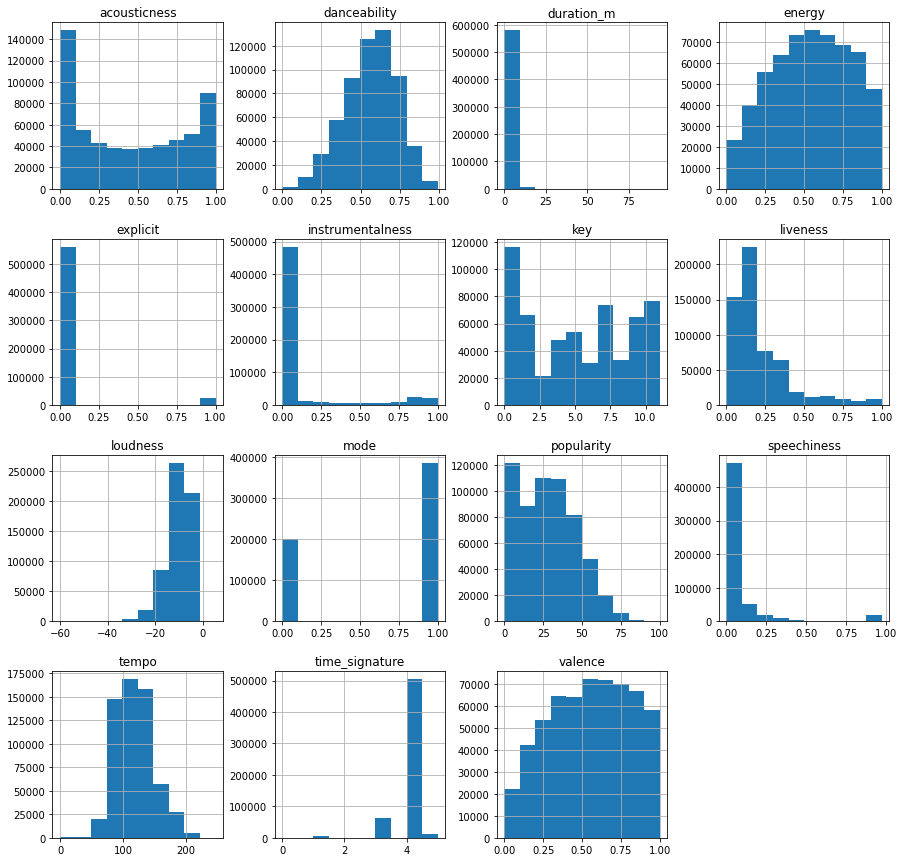

In [51]:
data.hist(figsize=(15, 15))
plt.show()

<AxesSubplot:>

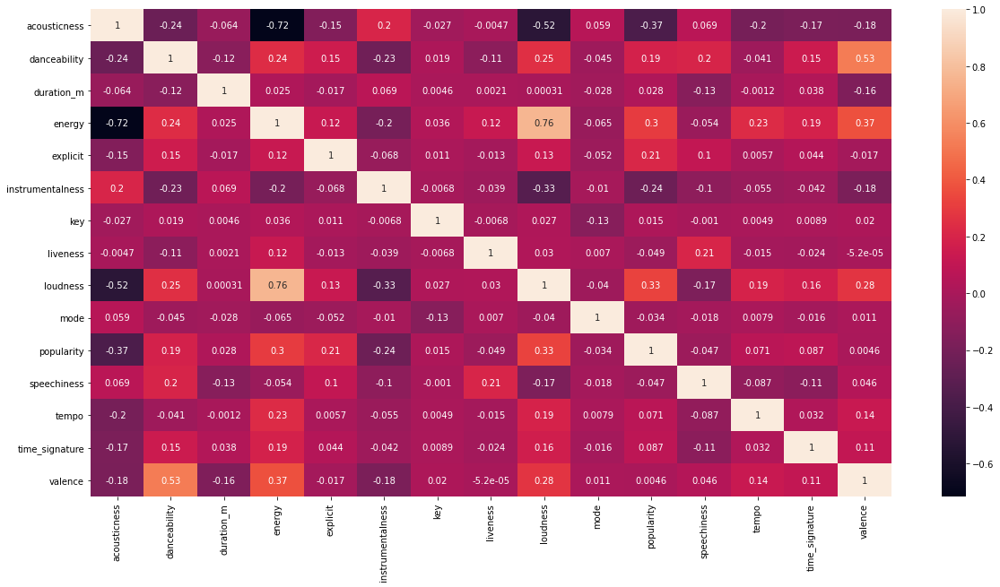

In [52]:
plt.figure(figsize=(20, 10))
sns.heatmap(data.corr(),annot = True)

## Reminder: my hypothesis: can we predict a song's popularity based on certain features of the song? 
### a few things stand out:
#### - acousticness
#### - instrumentalness
#### - loudness
#### - energy

<AxesSubplot:xlabel='acousticness', ylabel='popularity'>

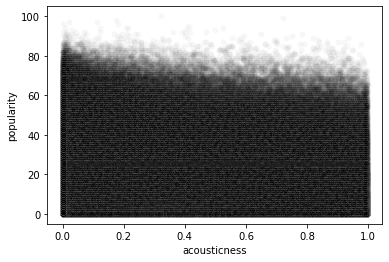

In [53]:
sns.scatterplot(x = 'acousticness', y = 'popularity', data = data, alpha = 0.03, color = 'black')

<AxesSubplot:xlabel='instrumentalness', ylabel='popularity'>

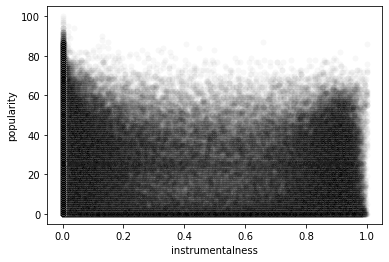

In [54]:
sns.scatterplot(x = 'instrumentalness', y = 'popularity', data = data, alpha = 0.03, color = 'black')

<AxesSubplot:xlabel='loudness', ylabel='popularity'>

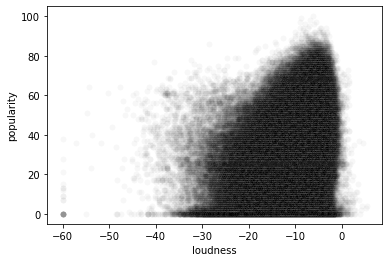

In [55]:
sns.scatterplot(x = 'loudness', y = 'popularity', data = data, alpha = 0.03, color = 'black')

<AxesSubplot:xlabel='energy', ylabel='popularity'>

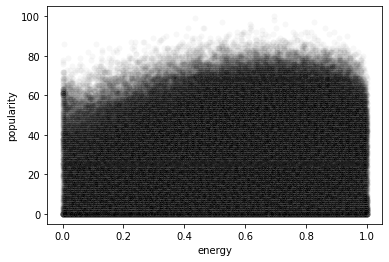

In [56]:
sns.scatterplot(x = 'energy', y = 'popularity', data = data, alpha = 0.03, color = 'black')

## Modeling and Predicting 

### 1. Linear Regression

In [57]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC

from sklearn.metrics import make_scorer, accuracy_score, roc_auc_score 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

In [58]:
data.head(20)

,acousticness,artists,danceability,duration_m,energy,explicit,id,id_artists,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,time_signature,valence
0,0.674,['Uli'],0.645,2.115050,0.4450,0,35iwgR4jXetI318WEWsa1Q,['45tIt06XoI0Iio4LBEVpls'],0.744000,0,0.1510,-13.338,1,Carve,6,1922-02-22,0.4510,104.851,3,0.1270
1,0.797,['Fernando Pessoa'],0.695,1.636667,0.2630,0,021ht4sdgPcrDgSk7JTbKY,['14jtPCOoNZwquk5wd9DxrY'],0.000000,0,0.1480,-22.136,1,Capítulo 2.16 - Banquero Anarquista,0,1922-06-01,0.9570,102.009,1,0.6550
2,0.994,['Ignacio Corsini'],0.434,3.027333,0.1770,0,07A5yehtSnoedViJAZkNnc,['5LiOoJbxVSAMkBS2fUm3X2'],0.021800,1,0.2120,-21.180,1,Vivo para Quererte - Remasterizado,0,1922-03-21,0.0512,130.418,5,0.4570
3,0.995,['Ignacio Corsini'],0.321,2.948450,0.0946,0,08FmqUhxtyLTn6pAh6bk45,['5LiOoJbxVSAMkBS2fUm3X2'],0.918000,7,0.1040,-27.961,1,El Prisionero - Remasterizado,0,1922-03-21,0.0504,169.980,3,0.3970
4,0.989,['Dick Haymes'],0.402,2.718000,0.1580,0,08y9GfoqCWfOGsKdwojr5e,['3BiJGZsyX9sJchTqcSA7Su'],0.130000,3,0.3110,-16.900,0,Lady of the Evening,0,1922,0.0390,103.220,4,0.1960
5,0.994,['Dick Haymes'],0.227,2.982217,0.2610,0,0BRXJHRNGQ3W4v9frnSfhu,['3BiJGZsyX9sJchTqcSA7Su'],0.247000,5,0.0977,-12.343,1,Ave Maria,0,1922,0.0382,118.891,4,0.0539
6,0.965,['Francis Marty'],0.510,2.241117,0.3550,0,0Dd9ImXtAtGwsmsAD69KZT,['2nuMRGzeJ5jJEKlfS7rZ0W'],0.000000,4,0.1550,-12.833,1,La Butte Rouge,0,1922,0.1240,85.754,5,0.7270
7,0.993,['Mistinguett'],0.563,2.690450,0.1840,0,0IA0Hju8CAgYfV1hwhidBH,['4AxgXfD7ISvJSTObqm4aIE'],0.000016,4,0.3250,-13.757,1,La Java,0,1922,0.0512,133.088,3,0.6540
8,0.620,['Greg Fieler'],0.488,5.167883,0.4750,0,0IgI1UCz84pYeVetnl1lGP,['5nWlsH5RDgFuRAiDeOFVmf'],0.006450,0,0.1070,-16.222,0,Old Fashioned Girl,0,1922,0.0399,139.952,4,0.5440
9,0.996,['Ignacio Corsini'],0.548,3.019550,0.0391,0,0JV4iqw2lSKJaHBQZ0e5zK,['5LiOoJbxVSAMkBS2fUm3X2'],0.933000,6,0.1480,-23.228,1,Martín Fierro - Remasterizado,0,1922-03-29,0.1530,75.595,3,0.6120


In [59]:
data = pd.get_dummies(data, columns=['time_signature', 'key', 'mode'], drop_first=True)


In [60]:
pd.options.display.max_columns = None


In [61]:
data.head()

,acousticness,artists,danceability,duration_m,energy,explicit,id,id_artists,instrumentalness,liveness,loudness,name,popularity,release_date,speechiness,tempo,valence,time_signature_1,time_signature_3,time_signature_4,time_signature_5,key_1,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,mode_1
0,0.674,['Uli'],0.645,2.115050,0.4450,0,35iwgR4jXetI318WEWsa1Q,['45tIt06XoI0Iio4LBEVpls'],0.7440,0.151,-13.338,Carve,6,1922-02-22,0.4510,104.851,0.127,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0.797,['Fernando Pessoa'],0.695,1.636667,0.2630,0,021ht4sdgPcrDgSk7JTbKY,['14jtPCOoNZwquk5wd9DxrY'],0.0000,0.148,-22.136,Capítulo 2.16 - Banquero Anarquista,0,1922-06-01,0.9570,102.009,0.655,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0.994,['Ignacio Corsini'],0.434,3.027333,0.1770,0,07A5yehtSnoedViJAZkNnc,['5LiOoJbxVSAMkBS2fUm3X2'],0.0218,0.212,-21.180,Vivo para Quererte - Remasterizado,0,1922-03-21,0.0512,130.418,0.457,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1
3,0.995,['Ignacio Corsini'],0.321,2.948450,0.0946,0,08FmqUhxtyLTn6pAh6bk45,['5LiOoJbxVSAMkBS2fUm3X2'],0.9180,0.104,-27.961,El Prisionero - Remasterizado,0,1922-03-21,0.0504,169.980,0.397,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,0.989,['Dick Haymes'],0.402,2.718000,0.1580,0,08y9GfoqCWfOGsKdwojr5e,['3BiJGZsyX9sJchTqcSA7Su'],0.1300,0.311,-16.900,Lady of the Evening,0,1922,0.0390,103.220,0.196,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0


In [62]:
features = ["acousticness", "danceability", "duration_m", "energy", "instrumentalness", "key_1", "key_2", "key_3", "key_4", "key_5", "key_6", "key_7", "key_8", "key_9", "key_10", "key_11", "liveness", 
            "mode_1", "speechiness", "loudness", "tempo", "time_signature_1", "time_signature_3", "time_signature_4", "time_signature_5", "valence"]

In [79]:

X = data[features]
y = data['popularity']


In [81]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

features2 = ['acousticness', 'instrumentalness', 'loudness', 'energy']

X_train, X_test, y_train, y_test = train_test_split(X[features2], y, train_size=0.5, random_state=8)


In [82]:

lr = LinearRegression()
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

0.18121707528930808

In [83]:
print(lr.intercept_)
print(lr.coef_)
zip(features, lr.coef_)

46.85249953892243
[-16.37845584  -8.72221265   0.70388047  -6.91002171]


In [98]:
y_pred = lr.predict(X_test)

In [99]:
from sklearn import metrics
from sklearn.metrics import r2_score


In [100]:
print(metrics.r2_score(y_test, y_pred))
print(metrics.mean_absolute_error(y_test, y_pred))
print(metrics.mean_squared_error(y_test, y_pred))
print(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

0.18121707528930808
13.558153814059963
276.9304122382212
16.641226284087995


In [67]:
from sklearn.model_selection import cross_val_score
from sklearn import datasets, linear_model

scores = cross_val_score(linreg, X, y, cv=5)
print(scores)

[0.18275505 0.20267594 0.07077479 0.16832437 0.23586097]


In [68]:
X.columns

Index(['acousticness', 'danceability', 'duration_m', 'energy',
       'instrumentalness', 'key_1', 'key_2', 'key_3', 'key_4', 'key_5',
       'key_6', 'key_7', 'key_8', 'key_9', 'key_10', 'key_11', 'liveness',
       'mode_1', 'speechiness', 'loudness', 'tempo', 'time_signature_1',
       'time_signature_3', 'time_signature_4', 'time_signature_5', 'valence'],
      dtype='object')

In [69]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

predictors = ['acousticness', 'instrumentalness', 'loudness', 'energy']

X_train, X_test, y_train, y_test = train_test_split(X[predictors], y, train_size=0.5, random_state=8)


lr = LinearRegression()
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

0.18121707528930808

In [ ]:
features = ["acousticness", "danceability", "duration_m", "energy", "instrumentalness", "key_1", "key_2", "key_3", "key_4", "key_5", "key_6", "key_7", "key_8", "key_9", "key_10", "key_11", "liveness", 
            "mode_1", "speechiness", "loudness", "tempo", "time_signature_1", "time_signature_3", "time_signature_4", "time_signature_5", "valence"]

X = data[features]
y = data['popularity']

linreg = LinearRegression()
linreg.fit(X, y)

from sklearn.model_selection import cross_val_score
from sklearn import datasets, linear_model

scores = cross_val_score(linreg, X, y, cv=5)
print(scores)

/Users/philip.peker/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


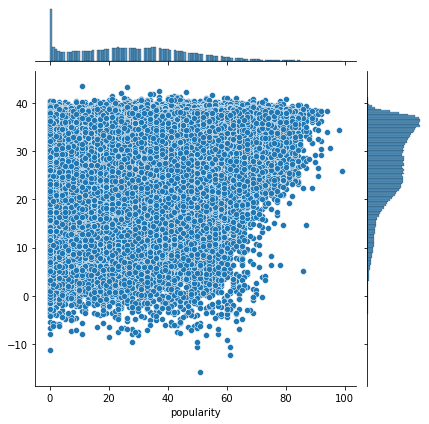

In [70]:
yhat = lr.predict(X_test)
sns.jointplot(y_test, yhat);

In [71]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X[predictors], y, train_size=0.7, random_state=8)


lr2 = LinearRegression()
lr2.fit(X_train,y_train)
lr2.score(X_test, y_test)

0.1811153651476647

In [72]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X[predictors], y, train_size=0.9, random_state=8)


lr2 = LinearRegression()
lr2.fit(X_train,y_train)
lr2.score(X_test, y_test)

0.18159210238122425

In [73]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics

# iterate through folds 5-10
for folds in range(5,11):
    print('------------------------------------\n')
    print('K: {}'.format(folds))
    model = LinearRegression()
    
    # Perform cross-validation
    scores = cross_val_score(model, X[predictors], y, cv=folds)
    print("Cross-validated scores: {}".format(scores))
    print("Mean CV R2: {}".format(np.mean(scores)))
    print('Std CV R2: {}'.format(np.std(scores)))
    
    # Make cross-validated predictions
    predictions = cross_val_predict(model, X[predictors], y, cv=folds)
    
    r2 = metrics.r2_score(y, predictions)
    print("Cross-Predicted R2: {}".format(r2))

------------------------------------

K: 5
Cross-validated scores: [0.18799477 0.17819803 0.03854096 0.11882471 0.18351464]
Mean CV R2: 0.14141462208042505
Std CV R2: 0.05725108631306723
Cross-Predicted R2: 0.15996773880080484
------------------------------------

K: 6
Cross-validated scores: [0.20792095 0.18244657 0.07065205 0.08421738 0.13797203 0.1674146 ]
Mean CV R2: 0.14177059740428075
Std CV R2: 0.05012096901319629
Cross-Predicted R2: 0.16289242890140665
------------------------------------

K: 7
Cross-validated scores: [0.23427281 0.1907972  0.12039555 0.01546297 0.09862627 0.16834768
 0.14895084]
Mean CV R2: 0.13955047577846283
Std CV R2: 0.06541690963085611
Cross-Predicted R2: 0.16487214762601043
------------------------------------

K: 8
Cross-validated scores: [0.26085883 0.18478291 0.15318053 0.02642255 0.05031739 0.09181913
 0.22985048 0.14618803]
Mean CV R2: 0.14292748104888664
Std CV R2: 0.07753477790397136
Cross-Predicted R2: 0.1657536904871576
-------------------------

## Decision tree:

In [74]:

from sklearn.tree import DecisionTreeRegressor

max_depth_range = range(1, 15)

RMSE_scores = []

from sklearn.model_selection import cross_val_score
for depth in max_depth_range:
    treereg = DecisionTreeRegressor(max_depth=depth, random_state=1)
    MSE_scores = cross_val_score(treereg, X, y, cv=5, scoring='neg_mean_squared_error')
    RMSE_scores.append(np.mean(np.sqrt(-MSE_scores)))

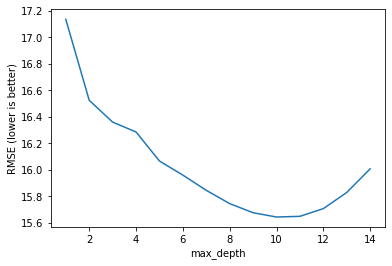

In [75]:
plt.plot(max_depth_range, RMSE_scores);
plt.xlabel('max_depth');
plt.ylabel('RMSE (lower is better)');

In [76]:
sorted(zip(RMSE_scores, max_depth_range))[0]

(15.642561258531344, 10)

In [77]:
treereg = DecisionTreeRegressor(max_depth=10, random_state=1)
treereg.fit(X, y)

DecisionTreeRegressor(max_depth=10, random_state=1)

In [78]:
# Computing feature importances.
pd.DataFrame({'feature':features, 'importance':treereg.feature_importances_}).sort_values(by='importance', ascending=False)

,feature,importance
0,acousticness,0.503203
19,loudness,0.179194
2,duration_m,0.071674
4,instrumentalness,0.068786
25,valence,0.060702
1,danceability,0.047011
18,speechiness,0.035808
16,liveness,0.012664
3,energy,0.012257
20,tempo,0.007397


## 2. random forest:

In [80]:
from sklearn.ensemble import RandomForestRegressor

In [81]:
rfreg = RandomForestRegressor(n_estimators=150,
                              max_features=5,
                              oob_score=True,
                              random_state=1)
rfreg.fit(X, y)

RandomForestRegressor(max_features=5, n_estimators=150, oob_score=True,
                      random_state=1)

In [82]:
pd.DataFrame({'feature':features,
              'importance':rfreg.feature_importances_}).sort_values(by='importance', ascending=False)

,feature,importance
0,acousticness,0.159117
19,loudness,0.125798
3,energy,0.096831
2,duration_m,0.095887
1,danceability,0.080194
25,valence,0.080161
18,speechiness,0.077163
4,instrumentalness,0.076288
20,tempo,0.069082
16,liveness,0.065576


In [83]:
print((rfreg.oob_score_))


0.38780239377305914


In [84]:

scores = cross_val_score(rfreg, X, y, cv=5, scoring='neg_mean_squared_error')
np.mean(np.sqrt(-scores))

14.797757727431156

### Regression analysis is not getting us too far. Time to try a classification approach:

In [90]:
data.head()

,acousticness,artists,danceability,duration_m,energy,explicit,id,id_artists,instrumentalness,liveness,loudness,name,popularity,release_date,speechiness,tempo,valence,time_signature_1,time_signature_3,time_signature_4,time_signature_5,key_1,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,mode_1
0,0.674,['Uli'],0.645,2.115050,0.4450,0,35iwgR4jXetI318WEWsa1Q,['45tIt06XoI0Iio4LBEVpls'],0.7440,0.151,-13.338,Carve,6,1922-02-22,0.4510,104.851,0.127,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0.797,['Fernando Pessoa'],0.695,1.636667,0.2630,0,021ht4sdgPcrDgSk7JTbKY,['14jtPCOoNZwquk5wd9DxrY'],0.0000,0.148,-22.136,Capítulo 2.16 - Banquero Anarquista,0,1922-06-01,0.9570,102.009,0.655,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0.994,['Ignacio Corsini'],0.434,3.027333,0.1770,0,07A5yehtSnoedViJAZkNnc,['5LiOoJbxVSAMkBS2fUm3X2'],0.0218,0.212,-21.180,Vivo para Quererte - Remasterizado,0,1922-03-21,0.0512,130.418,0.457,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1
3,0.995,['Ignacio Corsini'],0.321,2.948450,0.0946,0,08FmqUhxtyLTn6pAh6bk45,['5LiOoJbxVSAMkBS2fUm3X2'],0.9180,0.104,-27.961,El Prisionero - Remasterizado,0,1922-03-21,0.0504,169.980,0.397,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,0.989,['Dick Haymes'],0.402,2.718000,0.1580,0,08y9GfoqCWfOGsKdwojr5e,['3BiJGZsyX9sJchTqcSA7Su'],0.1300,0.311,-16.900,Lady of the Evening,0,1922,0.0390,103.220,0.196,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0


In [91]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [92]:
pd.cut(data['popularity'], bins=3)


0           (-0.1, 33.333]
1           (-0.1, 33.333]
2           (-0.1, 33.333]
3           (-0.1, 33.333]
4           (-0.1, 33.333]
                ...       
586667    (33.333, 66.667]
586668     (66.667, 100.0]
586669     (66.667, 100.0]
586670    (33.333, 66.667]
586671    (33.333, 66.667]
Name: popularity, Length: 586601, dtype: category
Categories (3, interval[float64]): [(-0.1, 33.333] < (33.333, 66.667] < (66.667, 100.0]]

In [93]:
pd.cut(data['popularity'], bins=3, labels = ["low", "medium", "high"]).value_counts()


low       362562
medium    212672
high       11367
Name: popularity, dtype: int64

In [90]:
data['popularity'] = pd.cut(data.popularity, bins=3, labels = ["low", "medium", "high"], right = True)

In [91]:
data.head(100)

,acousticness,artists,danceability,duration_m,energy,explicit,id,id_artists,instrumentalness,liveness,loudness,name,popularity,release_date,speechiness,tempo,valence,time_signature_1,time_signature_3,time_signature_4,time_signature_5,key_1,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,mode_1
0,0.674,['Uli'],0.645,2.115050,0.4450,0,35iwgR4jXetI318WEWsa1Q,['45tIt06XoI0Iio4LBEVpls'],0.7440,0.151,-13.338,Carve,low,1922-02-22,0.4510,104.851,0.127,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0.797,['Fernando Pessoa'],0.695,1.636667,0.2630,0,021ht4sdgPcrDgSk7JTbKY,['14jtPCOoNZwquk5wd9DxrY'],0.0000,0.148,-22.136,Capítulo 2.16 - Banquero Anarquista,low,1922-06-01,0.9570,102.009,0.655,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0.994,['Ignacio Corsini'],0.434,3.027333,0.1770,0,07A5yehtSnoedViJAZkNnc,['5LiOoJbxVSAMkBS2fUm3X2'],0.0218,0.212,-21.180,Vivo para Quererte - Remasterizado,low,1922-03-21,0.0512,130.418,0.457,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1
3,0.995,['Ignacio Corsini'],0.321,2.948450,0.0946,0,08FmqUhxtyLTn6pAh6bk45,['5LiOoJbxVSAMkBS2fUm3X2'],0.9180,0.104,-27.961,El Prisionero - Remasterizado,low,1922-03-21,0.0504,169.980,0.397,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,0.989,['Dick Haymes'],0.402,2.718000,0.1580,0,08y9GfoqCWfOGsKdwojr5e,['3BiJGZsyX9sJchTqcSA7Su'],0.1300,0.311,-16.900,Lady of the Evening,low,1922,0.0390,103.220,0.196,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.987,['Félix Mayol'],0.716,2.526217,0.3010,0,4CjnVzvSu86vqI5gY8SjPx,['7DIlOK9L8d0IQ7Xk8aJxDW'],0.0000,0.277,-14.070,Elle Vendait Des P'tits Gateaux,low,1922,0.1050,129.153,0.969,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1
96,0.994,"['Dick Haymes', 'Victor Young', 'His Orchestra']",0.279,2.614667,0.1280,0,4DE7VBCgyTjqV0Plc9Ra0U,"['3BiJGZsyX9sJchTqcSA7Su', '3HqN7Sq7rmpOEI9UV5...",0.6130,0.116,-19.793,Hush-A-Bye (Wee Rose of Kilarney),low,1922,0.0406,79.121,0.145,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
97,0.520,['Fernando Pessoa'],0.714,1.620000,0.2190,0,4FCWuuqM851ACz8p1b41fi,['14jtPCOoNZwquk5wd9DxrY'],0.0000,0.222,-21.185,Capítulo 2.23 - Banquero Anarquista,low,1922-06-01,0.9540,110.822,0.540,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
98,0.996,['Ignacio Corsini'],0.541,2.684667,0.1610,0,4RR5RKLA2vTQxkWrMIeHem,['5LiOoJbxVSAMkBS2fUm3X2'],0.9070,0.129,-21.250,Cap Polonio - Remasterizado,low,1922-03-21,0.0940,143.105,0.708,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1


In [92]:
data.loc[data['popularity']== 'high']

,acousticness,artists,danceability,duration_m,energy,explicit,id,id_artists,instrumentalness,liveness,loudness,name,popularity,release_date,speechiness,tempo,valence,time_signature_1,time_signature_3,time_signature_4,time_signature_5,key_1,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,mode_1
22549,0.994,"['Erik Satie', 'Philippe Entremont']",0.469,3.431117,0.0128,0,5NGtFXVpXSvwunEIGeviY3,"['459INk8vcC0ebEef82WjIK', '4x2fCu6MNErew0pb64...",0.937000,0.0941,-36.856,Gymnopédie No. 1,high,1949,0.1190,72.765,0.3540,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
27499,0.920,['Nat King Cole'],0.349,3.199550,0.1820,0,648TTtYB0bH0P8Hfy0FmkL,['7v4imS0moSyGdXyLgVTIV7'],0.015200,0.1430,-13.507,Unforgettable,high,1954-01-01,0.0310,136.094,0.1780,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
29498,0.452,['Frank Sinatra'],0.585,3.729333,0.2470,0,3aEJMh1cXKEjgh52claxQp,['1Mxqyy3pSjf8kZZL4QVxS0'],0.000009,0.1070,-12.612,I've Got You Under My Skin - Remastered 1998,high,1956-03,0.0400,127.150,0.5910,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1
29499,0.982,['Billie Holiday'],0.639,3.463783,0.2690,0,1pZn8AX1WulW8IO338hE5D,['1YzCsTRb22dQkh9lghPIrp'],0.120000,0.1410,-11.435,Blue Moon,high,1956-01-01,0.0698,124.866,0.5390,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
30498,0.913,"['Ella Fitzgerald', 'Louis Armstrong']",0.443,3.086000,0.1040,0,78MI7mu1LV1k4IA2HzKmHe,"['5V0MlUE1Bft0mbLlND7FJz', '19eLuQmk9aCobbVDHc...",0.000000,0.1910,-17.042,Dream A Little Dream Of Me - Single Version,high,1957-01-01,0.1010,76.497,0.3940,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586650,0.845,['Clinton Kane'],0.493,3.313317,0.4610,0,1uviKYHZuM4uINK33F7sCt,['7okSU80WTrn4LXlyXYbX3P'],0.000000,0.1150,-8.524,Fix It to Break It,high,2020-03-27,0.0456,51.414,0.3500,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1
586657,0.996,['Laureen Conrad'],0.609,1.375000,0.0172,0,1dKxf4Ht2SsKLyXfSDJAgy,['7vgGpuiXdNlCmc994PlMlz'],0.973000,0.1080,-28.573,The Cutest Puppy,high,2020-10-30,0.1180,68.619,0.8900,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
586661,0.618,['Clinton Kane'],0.590,3.372583,0.4430,0,27kcZEJvhkb1rzZS9gCpdA,['7okSU80WTrn4LXlyXYbX3P'],0.000000,0.1100,-5.662,remember the mornings,high,2020-11-27,0.0722,149.447,0.3420,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
586668,0.141,['ROLE MODEL'],0.765,2.554883,0.6630,0,0NuWgxEp51CutD2pJoF4OM,['1dy5WNgIKQU6ezkpZs4y8z'],0.000297,0.0924,-5.223,blind,high,2020-10-21,0.0652,150.091,0.6860,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


In [233]:
y = data.popularity
y.value_counts()/y.count()

low       0.618073
medium    0.362550
high      0.019378
Name: popularity, dtype: float64

In [234]:
import numpy as np
import pandas as pd
pop_count = data.popularity.value_counts()

In [235]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()
X_ros, y_ros = ros.fit_resample(X, y)

print('Removed indexes:')

print(X_ros.shape, y_ros.shape)

Removed indexes:
(1087686, 4) (1087686,)


In [236]:
y_ros.value_counts()

high      362562
medium    362562
low       362562
Name: popularity, dtype: int64

In [230]:
X_ros.value_counts()

acousticness  instrumentalness  loudness  energy
0.0106        0.000000          -5.797    0.634     46
0.1810        0.000003          -8.026    0.538     43
0.1010        0.001790          -2.495    0.828     41
0.1510        0.000362          -4.470    0.812     40
0.1360        0.000041          -3.838    0.696     37
                                                    ..
0.6700        0.000000          -4.086    0.659      1
                                -4.062    0.714      1
                                -3.949    0.592      1
              0.000001          -17.056   0.162      1
0.4270        0.000002          -15.835   0.503      1
Length: 563685, dtype: int64

#### reinputting 4 features to set up design matrix 


In [237]:
feature_cols = ['acousticness', 'instrumentalness', 'loudness', 'energy']
X = data[feature_cols]


In [226]:
X_ros.head()

,acousticness,instrumentalness,loudness,energy
0,0.674,0.7440,-13.338,0.4450
1,0.797,0.0000,-22.136,0.2630
2,0.994,0.0218,-21.180,0.1770
3,0.995,0.9180,-27.961,0.0946
4,0.989,0.1300,-16.900,0.1580


In [227]:
X.head()

,acousticness,instrumentalness,loudness,energy
0,0.674,0.7440,-13.338,0.4450
1,0.797,0.0000,-22.136,0.2630
2,0.994,0.0218,-21.180,0.1770
3,0.995,0.9180,-27.961,0.0946
4,0.989,0.1300,-16.900,0.1580


In [238]:
print(X_ros.shape)
print(y_ros.shape)

(1087686, 4)
(1087686,)


In [197]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_ros, y_ros)

KNeighborsClassifier(n_neighbors=1)

### evaluating model 

In [198]:

y_pred_class = knn.predict(X_ros)

# compute classification accuracy
from sklearn import metrics

print(metrics.accuracy_score(y_ros, y_pred_class))

0.9903391236073646


In [100]:
#this is a paradigm shift in terms of accuracy from our regression analysis. 
#A ~99% accuracy as compared to >19% during our regression analysis. 
#Perhaps we are overfitting here, as this smells suspicious...

In [101]:
#Let's creat a 50/50 train-test-split of our target/predictors. We'll refit KNN and check out the accuracy 

In [199]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_ros, y_ros, random_state=99, test_size=0.5)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

y_pred_class = knn.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred_class))

0.7805432817927233


In [200]:
X_train, X_test, y_train, y_test = train_test_split(X_ros, y_ros, random_state=99, test_size=0.3)

knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)

y_pred_class = knn.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred_class))

0.8071043744215552


In [104]:
#Looks a bit more adjusted, but still significantly better than during regression analysis. 
#But let's dig further into assessing accuracy.
#We'll search for the best value for K below...

In [105]:

k_range = range(1, 21)
# list of scores from k_range
k_scores = []
# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X_train, y_train, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.5845386617411109, 0.6083334017141224, 0.6020139161124879, 0.6302853009117839, 0.6217121579964839, 0.6366541999886064, 0.6315553162528235, 0.6418468302117184, 0.637486099977195, 0.645269943118372, 0.6413848372496389, 0.6476258915392398, 0.6449409223547822, 0.6498727367400968, 0.6472184534856015, 0.6514700764170285, 0.6493459676416816, 0.6530929879371726, 0.651219476111148, 0.6542965331117203]


In [106]:
k_range = range(20, 27)
# list of scores from k_range
k_scores = []
# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.6542965331117203, 0.6529463762559837, 0.6556262283749279, 0.6540271816775242, 0.6565945205750079, 0.6554080198279761, 0.6574434796379112]


In [107]:
k_range = range(30, 37)
# list of scores from k_range
k_scores = []
# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.6584492749228644, 0.6579088706427941, 0.6590288858064157, 0.6585225768184132, 0.6592283402898799, 0.6587288503312296, 0.6596681632585556]


In [108]:
k_range = range(40, 49)
# list of scores from k_range
k_scores = []
# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.6607216925045644, 0.6603790389713915, 0.660994450845202, 0.6606790726302585, 0.6613268744176171, 0.6612842550809419, 0.6619064849524354, 0.6616592972635045, 0.6621979948573055]


In [109]:
k_range = range(82, 89)
# list of scores from k_range
k_scores = []
# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.665426770462253, 0.665537578276133, 0.6659023927211128, 0.6657796523868835, 0.6659109169691485, 0.6658700031127063, 0.6660404769866053]


In [145]:
k_range = range(97, 106)
# list of scores from k_range
k_scores = []
# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

[0.6663388061969082, 0.6662757308183758, 0.6663149395578485, 0.6664666617367401, 0.6663251681091424, 0.6663268730662757, 0.6664240429086341, 0.6665246227233814, 0.6665041658242215]


In [155]:
k_dict=dict(zip(k_range,k_scores))
k_dict

{114: 0.6670957105068112,
 115: 0.6667735149044678,
 116: 0.6669576266917658,
 117: 0.6668434089345584,
 118: 0.6669763787355065,
 119: 0.6669371696763615,
 120: 0.667070139506371,
 121: 0.6670718441293013,
 122: 0.667232090018598,
 123: 0.6671434434943195,
 124: 0.6672014044954914,
 125: 0.6671263952307372,
 126: 0.6672678891053545,
 127: 0.6673053927859802,
 128: 0.6674059729203996,
 129: 0.6673633542375992,
 130: 0.667503143227736,
 131: 0.667448591501486,
 132: 0.6674417723413587,
 133: 0.6674605245449355,
 134: 0.6674110873704133}

In [156]:
max(k_dict, key= k_dict.get)

130

Text(0, 0.5, 'Cross-Validated Accuracy')

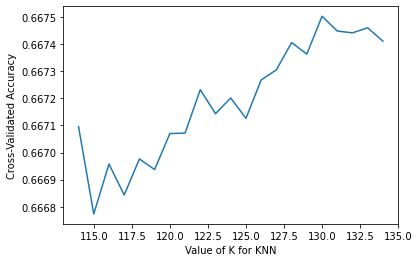

In [157]:
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

In [248]:
from sklearn.model_selection import RandomizedSearchCV
k_range2 = range(1, 22)
param_dist = dict(n_neighbors=k_range2)


In [249]:
rand = RandomizedSearchCV(knn, param_dist, cv=5, scoring='accuracy', n_iter=5, random_state=5)

In [250]:
rand.fit(X_train, y_train)


RandomizedSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=130),
                   n_iter=5, param_distributions={'n_neighbors': range(1, 22)},
                   random_state=5, scoring='accuracy')

In [253]:
rand.cv_results_

{'mean_fit_time': array([402.44450922, 304.38352833, 267.04521246, 241.8336854 ,
        250.67644262]),
 'std_fit_time': array([40.31848472, 56.74262536, 50.99175876, 25.04144403, 28.44438352]),
 'mean_score_time': array([24.12739077, 26.63236585, 21.81958284, 19.35740137, 20.823282  ]),
 'std_score_time': array([2.51208565, 6.35036333, 2.83997707, 1.21783287, 4.17903123]),
 'param_n_neighbors': masked_array(data=[3, 18, 20, 21, 19],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'n_neighbors': 3},
  {'n_neighbors': 18},
  {'n_neighbors': 20},
  {'n_neighbors': 21},
  {'n_neighbors': 19}],
 'split0_test_score': array([0.74717618, 0.67061126, 0.66265859, 0.65827839, 0.66720297]),
 'split1_test_score': array([0.74741916, 0.670145  , 0.66233024, 0.65827182, 0.66632299]),
 'split2_test_score': array([0.74848302, 0.67168825, 0.66422155, 0.66039297, 0.66799102]),
 'split3_test_score': array([0.74604009, 0.67099215, 0.

In [273]:
# examining the best model
print(rand.best_score_) #single best score achieved across all params 
print(rand.best_params_) #Dictionary containing the parameters (k) used to generate that score
print(rand.best_estimator_) #estimator which gave the highest score 

0.7470671675116237
{'n_neighbors': 3}
KNeighborsClassifier(n_neighbors=3)


In [ ]:
#Our best KNN model can accurately predict labels for 74.71% of the data points, using optimal value for K (3). 


In [274]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [280]:
from sklearn.metrics import classification_report


### Classification Report

In [282]:
print(classification_report(y_test,y_pred_class))


              precision    recall  f1-score   support

        high       0.57      0.75      0.65    108856
         low       0.61      0.60      0.61    108831
      medium       0.48      0.34      0.40    108619

    accuracy                           0.57    326306
   macro avg       0.56      0.57      0.55    326306
weighted avg       0.56      0.57      0.55    326306



In [ ]:
#lets test it! 

In [283]:
#create a fake row
new_track = pd.DataFrame({
    'acousticness': 0.666,
    'instrumentalness': .003 ,
    'loudness': 3.4,
    'energy': .2,
}, index=[0])

In [284]:
import numpy as np
rand = KNeighborsClassifier(n_neighbors=3)
rand.fit(X_train, y_train)
rand.predict(new_track)

array(['low'], dtype=object)

In [285]:
np.unique(y_pred_class, return_counts = True)

(array(['high', 'low', 'medium'], dtype=object),
 array([142684, 107433,  76189]))

### confusion matrix

In [287]:
from sklearn.metrics import confusion_matrix


In [308]:
cmat = confusion_matrix(y_test, y_pred_class)
#print(cmat)
print('TP - True Negative {}'.format(cmat[0,0]))
print('FP - Flase Positive {}'.format(cmat[0,1]))
print('FN - False Negative {}'.format(cmat[1,0]))
print('TP - True Positive {}'.format(cmat[1,1]))
print('Accuracy Score: {}'.format(np.divide(np.sum([cmat[0,0], cmat[1,1], cmat[2,2]]), np.sum(cmat)))) 
print('Misclassification Rate: {}'.format(np.divide(np.sum([cmat[1,0], cmat[0,1], cmat[0,2], cmat[2,0], cmat[1,2], cmat[2,1]]), np.sum(cmat))))

TP - True Negative 81867
FP - Flase Positive 10676
FN - False Negative 19846
TP - True Positive 65832
Accuracy Score: 0.5651811489828565
Misclassification Rate: 0.4348188510171434


In [300]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred_class)

0.5651811489828565